In [ ]:
pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 11.9 MB/s eta 0:00:00


In [ ]:
# This will be our machine learning project
# This project serves to analyze Motor Vehicle Collision Data in Toronto
# Various machine learning techniques such as linear and logistic regression and clustering will be used

# Necessary imports
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import confusion_matrix, roc_curve, precision_recall_curve, auc, accuracy_score, classification_report, f1_score, precision_score, recall_score, silhouette_score, silhouette_samples
from datetime import datetime
import geopandas
import contextily
from sklearn.cluster import DBSCAN, KMeans
from pyproj import Proj # importing Proj
from sklearn.preprocessing import LabelEncoder, MultiLabelBinarizer, LabelBinarizer
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.inspection import permutation_importance
import statsmodels.api as sm
from sklearn.datasets import make_blobs

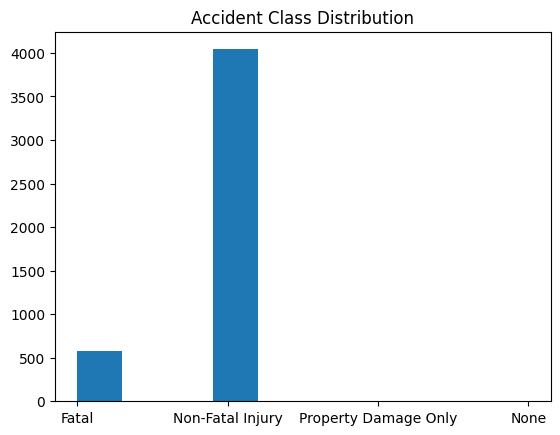

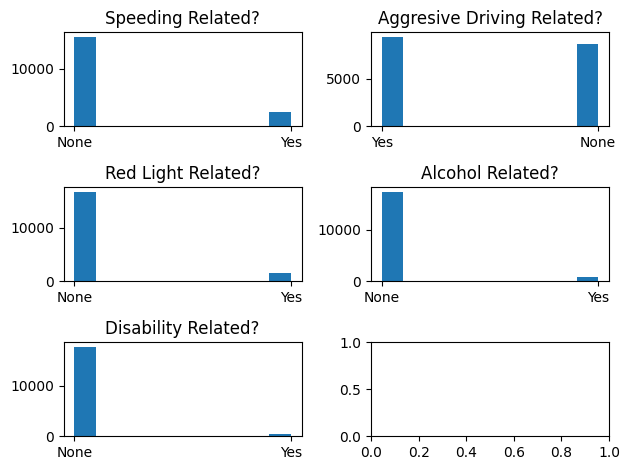

In [ ]:
# Importing the data
data = pd.read_csv("Motor Vehicle Collisions with KSI Data.csv")
data = data.drop_duplicates(subset = ["ACCNUM"], keep = "first")
plt.hist(data["ACCLASS"])
plt.title("Accident Class Distribution")
plt.show()
fig, ((ax0, ax1), (ax2, ax3), (ax4, _)) = plt.subplots(nrows=3,ncols=2)

data = pd.read_csv("Motor Vehicle Collisions with KSI Data.csv")

ax0.hist(data["SPEEDING"])
ax0.set_title('Speeding Related?')

ax1.hist(data["AG_DRIV"])
ax1.set_title('Aggresive Driving Related?')

ax2.hist(data["REDLIGHT"])
ax2.set_title('Red Light Related?')

ax3.hist(data["ALCOHOL"])
ax3.set_title('Alcohol Related?')

ax4.hist(data["DISABILITY"])
ax4.set_title('Disability Related?')

fig.tight_layout()
plt.show()
data = pd.read_csv("Motor Vehicle Collisions with KSI Data.csv")

In [ ]:
# Get an idea of the counts of values we have for each class
print(data["ACCLASS"].value_counts())
print(data["TRAFFCTL"].value_counts()) # None most likely means No Control
print(data["VISIBILITY"].value_counts()) # None most likely means Clear
print(data["RDSFCOND"].value_counts()) # None most likely means Dry
data['ACCLASS'] = data['ACCLASS'].replace(["None", "Property Damage Only", "Non-Fatal Injury"], 0)
data['ACCLASS'] = data['ACCLASS'].replace("Fatal", 1)
data['TRAFFCTL'] = data['TRAFFCTL'].replace("None", "No Control")
data['VISIBILITY'] = data['VISIBILITY'].replace("None", "Clear")
data['RDSFCOND'] = data['RDSFCOND'].replace("None", "Dry")
print(data["ACCLASS"].value_counts())
print(data["TRAFFCTL"].value_counts())
print(data["VISIBILITY"].value_counts())
print(data["RDSFCOND"].value_counts())
print(data["LOCCOORD"].value_counts())
print(data["SPEEDING"].value_counts())
print(data["AG_DRIV"].value_counts())
print(data["REDLIGHT"].value_counts())
print(data["ALCOHOL"].value_counts())
print(data["INJURY"].value_counts())
print(data["STREET1"].value_counts())
data["DISTRICT"] = data['DISTRICT'].replace("Toronto East York", "Toronto and East York")
print(data["DISTRICT"].value_counts())
print(data["NEIGHBOURHOOD_158"].value_counts())

Non-Fatal Injury        15599
Fatal                    2573
Property Damage Only       17
None                        5
Name: ACCLASS, dtype: int64
No Control              8791
Traffic Signal          7637
Stop Sign               1380
Pedestrian Crossover     198
Traffic Controller       108
None                      34
Yield Sign                21
Streetcar (Stop for)      16
Traffic Gate               5
School Guard               2
Police Control             2
Name: TRAFFCTL, dtype: int64
Clear                     15719
Rain                       1879
Snow                        351
Other                        97
Fog, Mist, Smoke, Dust       50
Freezing Rain                47
Drifting Snow                21
None                         20
Strong wind                  10
Name: VISIBILITY, dtype: int64
Dry                     14599
Wet                      3021
Loose Snow                169
Other                     145
Slush                     102
Ice                        77
Packe

In [ ]:
# Modifying the data
# data = data.assign(ACCLASS = data.ACCLASS.eq("FATAL").astype(int))
data = data.drop(["_id", "YEAR", "DATE", "TIME", "STREET1", "STREET2", "OFFSET", "ROAD_CLASS", "DISTRICT", "WARDNUM", "LOCCOORD", "ACCLOC", "IMPACTYPE", "INVTYPE","INJURY", "INVAGE", "FATAL_NO", "INITDIR", "VEHTYPE", "MANOEUVER", "DRIVACT", "DRIVCOND", "PEDTYPE", "PEDACT", "PEDCOND", "CYCLISTYPE", "CYCACT", "CYCCOND", "HOOD_158", "NEIGHBOURHOOD_158", "HOOD_140", "NEIGHBOURHOOD_140", "DIVISION", "geometry"], axis = "columns")
data = data.drop_duplicates(subset = ["ACCNUM"], keep = "first")
data = data.drop(["ACCNUM"], axis = "columns")
data = pd.get_dummies(data, drop_first = False)
data.head()

,ACCLASS,TRAFFCTL_No Control,TRAFFCTL_Pedestrian Crossover,TRAFFCTL_Police Control,TRAFFCTL_School Guard,TRAFFCTL_Stop Sign,TRAFFCTL_Streetcar (Stop for),TRAFFCTL_Traffic Controller,TRAFFCTL_Traffic Gate,TRAFFCTL_Traffic Signal,...,SPEEDING_None,SPEEDING_Yes,AG_DRIV_None,AG_DRIV_Yes,REDLIGHT_None,REDLIGHT_Yes,ALCOHOL_None,ALCOHOL_Yes,DISABILITY_None,DISABILITY_Yes
0,1,0,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,1,0,1,0
2,1,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,1,1,0,1,0
3,0,1,0,0,0,0,0,0,0,0,...,0,1,0,1,1,0,0,1,1,0
5,1,1,0,0,0,0,0,0,0,0,...,1,0,1,0,1,0,0,1,1,0
12,0,0,0,0,0,0,0,0,0,1,...,1,0,0,1,1,0,0,1,1,0


In [ ]:
# Calculate performance measures from scratch
# TP: true postives
# TN: true negatives
# FP: False positives
# FN: False negatives
def compute_performance(yhat, y, classes):
    # First, get tp, tn, fp, fn
    tp = sum(np.logical_and(yhat == classes[1], y == classes[1]))
    tn = sum(np.logical_and(yhat == classes[0], y == classes[0]))
    fp = sum(np.logical_and(yhat == classes[1], y == classes[0]))
    fn = sum(np.logical_and(yhat == classes[0], y == classes[1]))

    print(f"tp: {tp} tn: {tn} fp: {fp} fn: {fn}")

    # Accuracy
    acc = (tp + tn) / (tp + tn + fp + fn)

    # Precision
    # "Of the ones I labeled +, how many are actually +?"
    precision = tp / (tp + fp)

    # Recall
    # "Of all the + in the data, how many do I correctly label?"
    recall = tp / (tp + fn)

    # Sensitivity
    # "Of all the + in the data, how many do I correctly label?"
    sensitivity = recall

    # Specificity
    # "Of all the - in the data, how many do I correctly label?"
    specificity = tn / (fp + tn)

    # Print results

    print("Accuracy:",round(acc,3),"Precision:",round(precision,3),
          "Sensitivity:",round(sensitivity,3),"Specificity:",round(specificity,3))

In [ ]:
# Train and test split for our logistic regression problem
X = data.drop(['ACCLASS'], axis = 'columns')
y = data.ACCLASS

X_train, X_test, y_train, y_test = train_test_split(X,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0)

logreg = LogisticRegression(penalty = 'l2', class_weight="balanced", max_iter = 10000)
params = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
gscv_reg = GridSearchCV(logreg, cv=10, param_grid = params, scoring = 'recall')  # Using grid search CV
gscv_reg.fit(X_train, y_train)  # Fitting

# gscv_reg.fit(X_train, y_train) # fitting the model to the training data

predictions = gscv_reg.predict(X_test) # getting predictions of fatality or not
predicted_probabilities = gscv_reg.predict_proba(X_test)[:, 1] # getting probability of fatality or not

predictions_adjusted = (predicted_probabilities > 0.75).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)
predictions_adjusted = (predicted_probabilities > 0.475).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)
predictions_adjusted = (predicted_probabilities > 0.20).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)

log_coefficients = pd.DataFrame({'variables': X.columns.values,
                         'coefficients': gscv_reg.best_estimator_.coef_[0]})

log_coefficients # to visualize the coefficients

# In this case the positive is 1 (die) and the negative is 0 (alive)

tp: 2 tn: 815 fp: 2 fn: 107
Accuracy: 0.882 Precision: 0.5 Sensitivity: 0.018 Specificity: 0.998
tp: 68 tn: 458 fp: 359 fn: 41
Accuracy: 0.568 Precision: 0.159 Sensitivity: 0.624 Specificity: 0.561
tp: 109 tn: 0 fp: 817 fn: 0
Accuracy: 0.118 Precision: 0.118 Sensitivity: 1.0 Specificity: 0.0


,variables,coefficients
0,TRAFFCTL_No Control,0.064744
1,TRAFFCTL_Pedestrian Crossover,0.036871
2,TRAFFCTL_Police Control,-0.002428
3,TRAFFCTL_School Guard,-0.002428
4,TRAFFCTL_Stop Sign,0.015200
...,...,...
57,REDLIGHT_Yes,0.056271
58,ALCOHOL_None,-0.023187
59,ALCOHOL_Yes,0.023143
60,DISABILITY_None,0.042040


In [ ]:
logreg2 = LogisticRegression(penalty = 'l1', class_weight="balanced", solver = "liblinear", max_iter = 10000)
params = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
gscv_reg = GridSearchCV(logreg2, cv=10, param_grid = params, scoring = 'recall')  # Using grid search CV
gscv_reg.fit(X_train, y_train)  # Fitting

# gscv_reg.fit(X_train, y_train) # fitting the model to the training data

predictions = gscv_reg.predict(X_test) # getting predictions of fatality or not
predicted_probabilities = gscv_reg.predict_proba(X_test)[:, 1] # getting probability of fatality or not

predictions_adjusted = (predicted_probabilities > 0.75).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)
predictions_adjusted = (predicted_probabilities > 0.475).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)
predictions_adjusted = (predicted_probabilities > 0.20).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)

log_coefficients = pd.DataFrame({'variables': X.columns.values,
                         'coefficients': gscv_reg.best_estimator_.coef_[0]})

log_coefficients # to visualize the coefficients

tp: 6 tn: 808 fp: 9 fn: 103
Accuracy: 0.879 Precision: 0.4 Sensitivity: 0.055 Specificity: 0.989
tp: 69 tn: 438 fp: 379 fn: 40
Accuracy: 0.548 Precision: 0.154 Sensitivity: 0.633 Specificity: 0.536
tp: 109 tn: 9 fp: 808 fn: 0
Accuracy: 0.127 Precision: 0.119 Sensitivity: 1.0 Specificity: 0.011


,variables,coefficients
0,TRAFFCTL_No Control,0.000000
1,TRAFFCTL_Pedestrian Crossover,0.000000
2,TRAFFCTL_Police Control,0.000000
3,TRAFFCTL_School Guard,0.000000
4,TRAFFCTL_Stop Sign,0.000000
...,...,...
57,REDLIGHT_Yes,0.008341
58,ALCOHOL_None,0.000000
59,ALCOHOL_Yes,0.000000
60,DISABILITY_None,0.000000


In [ ]:
traffic_model = data[["TRAFFCTL_No Control","TRAFFCTL_Pedestrian Crossover", "TRAFFCTL_Police Control","TRAFFCTL_School Guard","TRAFFCTL_Stop Sign","TRAFFCTL_Streetcar (Stop for)","TRAFFCTL_Traffic Controller","TRAFFCTL_Traffic Gate", "TRAFFCTL_Traffic Signal", "TRAFFCTL_Yield Sign"]]
X_train, X_test, y_train, y_test = train_test_split(traffic_model,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0
                                                )

logreg3 = LogisticRegression(penalty = 'none', class_weight = "balanced", max_iter = 10000)
params = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
gscv_reg = GridSearchCV(logreg3, cv=10, param_grid = params, scoring = 'recall')  # Using grid search CV
gscv_reg.fit(X_train, y_train)  # Fitting

# gscv_reg.fit(X_train, y_train) # fitting the model to the training data

predictions = gscv_reg.predict(X_test) # getting predictions of fatality or not
predicted_probabilities = gscv_reg.predict_proba(X_test)[:, 1] # getting probability of fatality or not
predictions_adjusted = (predicted_probabilities > 0.475).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)

log_coefficients = pd.DataFrame({'variables': traffic_model.columns.values,
                         'coefficients': gscv_reg.best_estimator_.coef_[0]})

log_coefficients # to visualize the coefficients

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

tp: 69 tn: 339 fp: 478 fn: 40
Accuracy: 0.441 Precision: 0.126 Sensitivity: 0.633 Specificity: 0.415


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

,variables,coefficients
0,TRAFFCTL_No Control,8.748008
1,TRAFFCTL_Pedestrian Crossover,8.803169
2,TRAFFCTL_Police Control,-3.893487
3,TRAFFCTL_School Guard,-3.893487
4,TRAFFCTL_Stop Sign,8.531454
5,TRAFFCTL_Streetcar (Stop for),-6.426417
6,TRAFFCTL_Traffic Controller,-27.618309
7,TRAFFCTL_Traffic Gate,10.552279
8,TRAFFCTL_Traffic Signal,8.485022
9,TRAFFCTL_Yield Sign,-11.914355


In [ ]:
visibility_model = data[["VISIBILITY_Clear","VISIBILITY_Drifting Snow", "VISIBILITY_Fog, Mist, Smoke, Dust","VISIBILITY_Freezing Rain","VISIBILITY_Other","VISIBILITY_Rain","VISIBILITY_Snow","VISIBILITY_Strong wind"]]
X_train, X_test, y_train, y_test = train_test_split(visibility_model,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0
                                                )

logreg4 = LogisticRegression(penalty = 'none', class_weight = "balanced", max_iter = 10000)
params = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
gscv_reg = GridSearchCV(logreg4, cv=10, param_grid = params, scoring = 'recall')  # Using grid search CV
gscv_reg.fit(X_train, y_train)  # Fitting

# gscv_reg.fit(X_train, y_train) # fitting the model to the training data

predictions = gscv_reg.predict(X_test) # getting predictions of fatality or not
predicted_probabilities = gscv_reg.predict_proba(X_test)[:, 1] # getting probability of fatality or not
predictions_adjusted = (predicted_probabilities > 0.475).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)

log_coefficients = pd.DataFrame({'variables': visibility_model.columns.values,
                         'coefficients': gscv_reg.best_estimator_.coef_[0]})

log_coefficients # to visualize the coefficients

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

tp: 92 tn: 103 fp: 714 fn: 17
Accuracy: 0.211 Precision: 0.114 Sensitivity: 0.844 Specificity: 0.126


,variables,coefficients
0,VISIBILITY_Clear,2.330648
1,VISIBILITY_Drifting Snow,-6.346523
2,"VISIBILITY_Fog, Mist, Smoke, Dust",2.626309
3,VISIBILITY_Freezing Rain,-11.593211
4,VISIBILITY_Other,2.220101
5,VISIBILITY_Rain,2.197467
6,VISIBILITY_Snow,2.024214
7,VISIBILITY_Strong wind,4.232111


In [ ]:
light_model = data[["LIGHT_Dark","LIGHT_Dark, artificial","LIGHT_Dawn","LIGHT_Dawn, artificial","LIGHT_Daylight","LIGHT_Daylight, artificial","LIGHT_Dusk","LIGHT_Dusk, artificial","LIGHT_Other"]]
X_train, X_test, y_train, y_test = train_test_split(light_model,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0)

logreg5 = LogisticRegression(penalty = 'none', class_weight = "balanced", max_iter = 10000)
params = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
gscv_reg = GridSearchCV(logreg5, cv=10, param_grid = params, scoring = 'recall')  # Using grid search CV
gscv_reg.fit(X_train, y_train)  # Fitting

# gscv_reg.fit(X_train, y_train) # fitting the model to the training data

predictions = gscv_reg.predict(X_test) # getting predictions of fatality or not
predicted_probabilities = gscv_reg.predict_proba(X_test)[:, 1] # getting probability of fatality or not
predictions_adjusted = (predicted_probabilities > 0.475).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)

log_coefficients = pd.DataFrame({'variables': light_model.columns.values,
                         'coefficients': gscv_reg.best_estimator_.coef_[0]})

log_coefficients # to visualize the coefficients

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

tp: 44 tn: 501 fp: 316 fn: 65
Accuracy: 0.589 Precision: 0.122 Sensitivity: 0.404 Specificity: 0.613


,variables,coefficients
0,LIGHT_Dark,-0.020135
1,"LIGHT_Dark, artificial",0.155547
2,LIGHT_Dawn,0.030212
3,"LIGHT_Dawn, artificial",0.946555
4,LIGHT_Daylight,-0.416826
5,"LIGHT_Daylight, artificial",-0.902995
6,LIGHT_Dusk,0.328519
7,"LIGHT_Dusk, artificial",0.070063
8,LIGHT_Other,0.000000


In [ ]:
road_model = data[["RDSFCOND_Dry","RDSFCOND_Ice","RDSFCOND_Loose Sand or Gravel","RDSFCOND_Loose Snow","RDSFCOND_Other","RDSFCOND_Packed Snow","RDSFCOND_Slush","RDSFCOND_Spilled liquid","RDSFCOND_Wet"]]
X_train, X_test, y_train, y_test = train_test_split(road_model,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0)

logreg6 = LogisticRegression(penalty = 'none', class_weight = "balanced", max_iter = 10000)
params = {'C': [0.01, 0.1, 1, 10, 100, 1000]}
gscv_reg = GridSearchCV(logreg6, cv=10, param_grid = params, scoring = 'recall')  # Using grid search CV
gscv_reg.fit(X_train, y_train)  # Fitting

# gscv_reg.fit(X_train, y_train) # fitting the model to the training data

predictions = gscv_reg.predict(X_test) # getting predictions of fatality or not
predicted_probabilities = gscv_reg.predict_proba(X_test)[:, 1] # getting probability of fatality or not
predictions_adjusted = (predicted_probabilities > 0.475).astype(int)
compute_performance(predictions_adjusted, y_test, gscv_reg.classes_)

log_coefficients = pd.DataFrame({'variables': road_model.columns.values,
                         'coefficients': gscv_reg.best_estimator_.coef_[0]})

log_coefficients # to visualize the coefficients


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour

tp: 108 tn: 14 fp: 803 fn: 1
Accuracy: 0.132 Precision: 0.119 Sensitivity: 0.991 Specificity: 0.017


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


,variables,coefficients
0,RDSFCOND_Dry,3.407089
1,RDSFCOND_Ice,2.614829
2,RDSFCOND_Loose Sand or Gravel,-19.172663
3,RDSFCOND_Loose Snow,2.649019
4,RDSFCOND_Other,3.531390
5,RDSFCOND_Packed Snow,3.618101
6,RDSFCOND_Slush,2.925844
7,RDSFCOND_Spilled liquid,-6.372571
8,RDSFCOND_Wet,3.402436


In [ ]:
accident_model = data[["SPEEDING_None","AG_DRIV_None","REDLIGHT_None", "ALCOHOL_None", "DISABILITY_None","SPEEDING_Yes","AG_DRIV_Yes","REDLIGHT_Yes", "ALCOHOL_Yes", "DISABILITY_Yes"]]
X_train, X_test, y_train, y_test = train_test_split(accident_model,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0)

logreg7 = LogisticRegression(penalty = 'none', solver='lbfgs', class_weight = "balanced", max_iter = 10000)
logreg7.fit(X_train, y_train) # fitting the model to the training data

log_coefficients = pd.DataFrame({'variables': accident_model.columns.values,
                         'coefficients': logreg7.coef_[0]})
log_coefficients # to visualize the coefficients

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(


,variables,coefficients
0,SPEEDING_None,-0.496881
1,AG_DRIV_None,0.292231
2,REDLIGHT_None,-0.061218
3,ALCOHOL_None,0.007224
4,DISABILITY_None,0.325388
5,SPEEDING_Yes,0.536441
6,AG_DRIV_Yes,-0.252671
7,REDLIGHT_Yes,0.100778
8,ALCOHOL_Yes,0.032336
9,DISABILITY_Yes,-0.285828


In [ ]:
data = pd.read_csv('Motor Vehicle Collisions with KSI Data.csv') # reading in the data
data["geometry"] = data["geometry"].apply(eval) # convert to dictionary

latitudes = [] # list to store latitudes
longitudes = [] # list to store longitudes

# for loop to add the coordinates to each list
for i in range(len(data)):
    longitudes.append(data["geometry"][i]['coordinates'][0][0])
    latitudes.append(data["geometry"][i]['coordinates'][0][1])
data["long"] = longitudes # create longitude column
data["lat"] = latitudes # create latitude column
data = data.drop(["geometry"], axis = 1) # get rid of geometry column (don't need it anymore)
p = Proj(proj='utm',zone=17,ellps='WGS84', preserve_units=False) # creating the proj object to convert longitude and latitude to x and y

In [ ]:
def cluster1(dataframe):
    clusterer = DBSCAN(min_samples = 5) # create DBSCAN object
    clusterer.fit(dataframe[["x", "y"]]) # fit to the data
    print("The maximum number of clusters is " + str(max(clusterer.labels_) + 1)) # Max number of clusters
    lbls = pd.Series(clusterer.labels_, index=dataframe.index) # putting the labels as a pandas series as done in lab

    # Setup figure and axis (lab 3)
    f, ax = plt.subplots(1, figsize=(20, 20))

    # Subset points that are not part of any cluster (noise)
    noise = dataframe.loc[lbls == -1, ["x", "y"]]

    # Plot noise in grey
    ax.scatter(noise["x"], noise["y"], c="grey", s=5, linewidth=0)

    # Plot all points that are not noise in red
    # NOTE how this is done through some fancy indexing, where
    #      we take the index of all points (tw) and substract from
    #      it the index of those that are noise
    ax.scatter(
        dataframe.loc[dataframe.index.difference(noise.index), "x"],
        dataframe.loc[dataframe.index.difference(noise.index), "y"],
        c="red",
        s=200,
        linewidth=0,
    )

    # Add basemap
    contextily.add_basemap(
        ax, source=contextily.providers.CartoDB.Positron, crs="EPSG:32617"  #  a different crs is needed here
    )

    # Remove axes
    ax.set_axis_off()

    # Display the figure
    plt.show()

def elbow(coor):
    inertias = []

    for i in range(1,25):
        kmeans = KMeans(n_clusters=i)
        kmeans.fit(coor)
        inertias.append(kmeans.inertia_)

    plt.plot(range(1,25), inertias, marker='o')
    plt.title('Elbow method')
    plt.xlabel('Number of clusters')
    plt.ylabel('Inertia')
    plt.show()

def cluster2(dataframe, model, coor):
    model.fit(coor)
    f, ax = plt.subplots(1, figsize=(20, 20))

    ax.scatter(
        dataframe["x"],
        dataframe["y"],
        c = model.labels_
    )

    # Add basemap
    contextily.add_basemap(
        ax, source=contextily.providers.CartoDB.Positron, crs="EPSG:32617"  #  a different crs is needed here
    )

    # Remove axes
    ax.set_axis_off()

    # Display the figure
    plt.show()

def silhoutte(X, y):
  range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]

  for n_clusters in range_n_clusters:

      # Initialize the clusterer with n_clusters value and a random generator
      # seed of 10 for reproducibility.
      clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
      cluster_labels = clusterer.fit_predict(X)

      # The silhouette_score gives the average value for all the samples.
      # This gives a perspective into the density and separation of the formed
      # clusters
      silhouette_avg = silhouette_score(X, cluster_labels)
      print(
          "For n_clusters =",
          n_clusters,
          "The average silhouette_score is :",
          silhouette_avg,
      )


<ipython-input-16-d5c0ed8e27a8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
<ipython-input-16-d5c0ed8e27a8>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns


The maximum number of clusters is 158


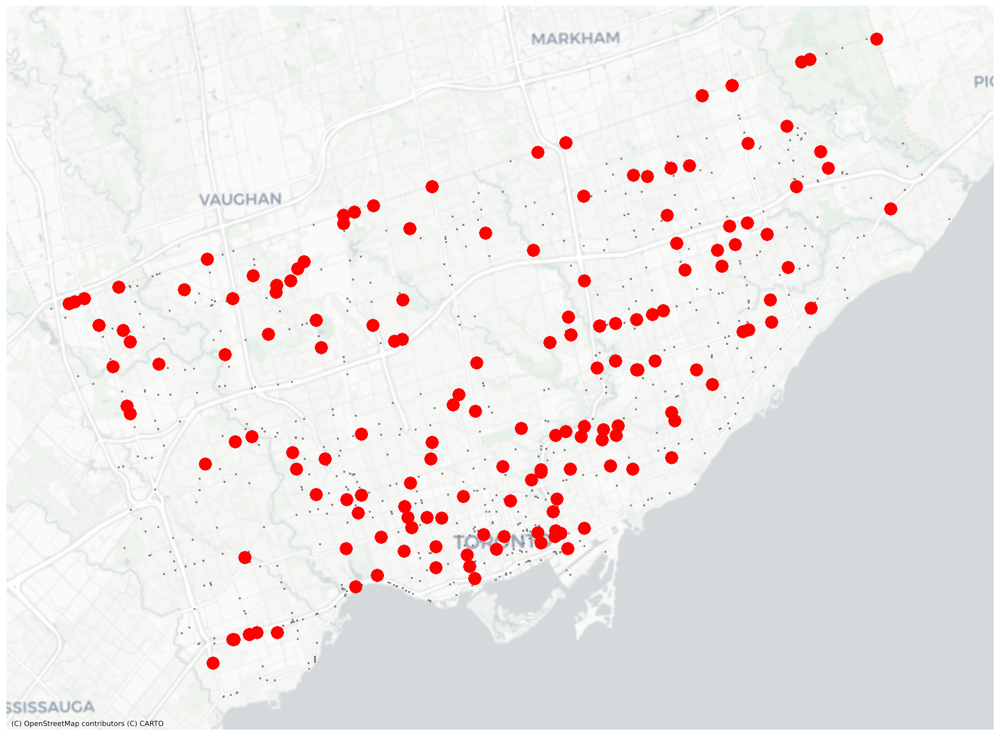

In [ ]:
db = data.query('SPEEDING == "Yes"') # we will only use the data where there has been an accident related to speeding
db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
cluster1(db)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

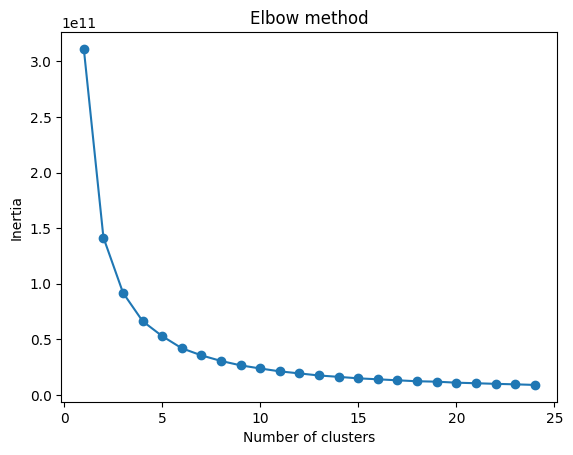

For n_clusters = 2 The average silhouette_score is : 0.6007021802449715
For n_clusters = 3 The average silhouette_score is : 0.5602413204058464
For n_clusters = 4 The average silhouette_score is : 0.5498950692884632
For n_clusters = 5 The average silhouette_score is : 0.5438463891238325
For n_clusters = 6 The average silhouette_score is : 0.5381678883521074
For n_clusters = 7 The average silhouette_score is : 0.543863741399098
For n_clusters = 8 The average silhouette_score is : 0.5616995613489478
For n_clusters = 9 The average silhouette_score is : 0.5682974824306302
For n_clusters = 10 The average silhouette_score is : 0.577069151852213
For n_clusters = 11 The average silhouette_score is : 0.5608968300931669
For n_clusters = 12 The average silhouette_score is : 0.5603773743554238
For n_clusters = 13 The average silhouette_score is : 0.5671541270858376
For n_clusters = 14 The average silhouette_score is : 0.568949367063539
For n_clusters = 15 The average silhouette_score is : 0.563628

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


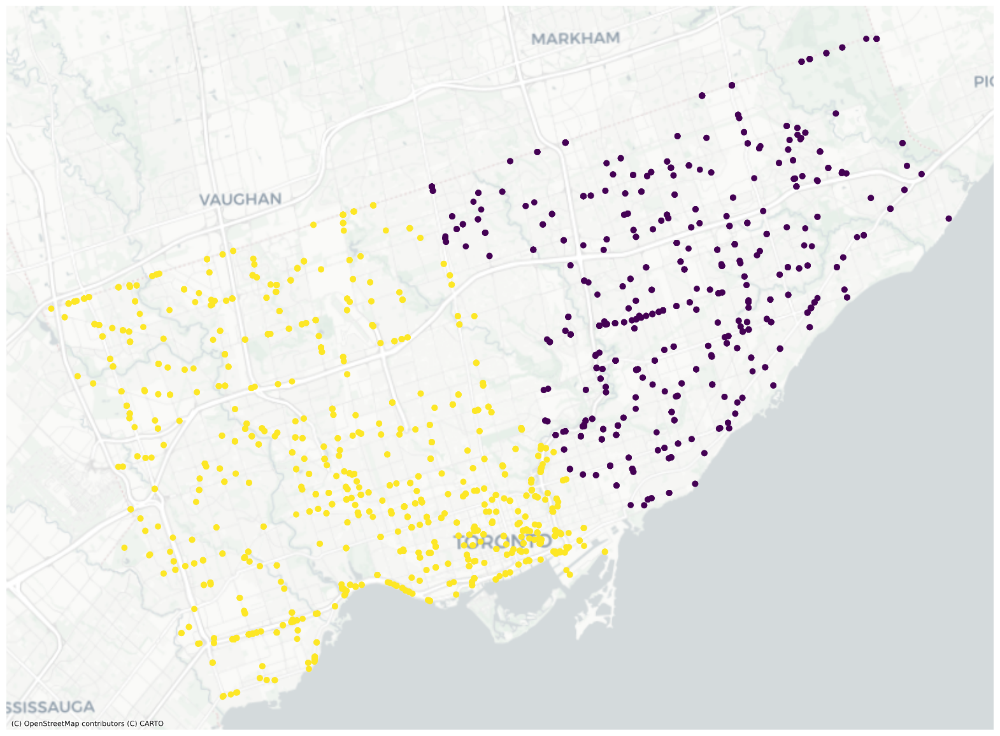

In [ ]:
coordinates = list(zip(db["x"], db["y"]))
elbow(coordinates)
silhoutte(np.array(db["x"]).reshape(-1,1), db["y"])
kmeans = KMeans(n_clusters=2)
cluster2(db, kmeans, coordinates)

<ipython-input-18-03790ec17dcc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
<ipython-input-18-03790ec17dcc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns


The maximum number of clusters is 514


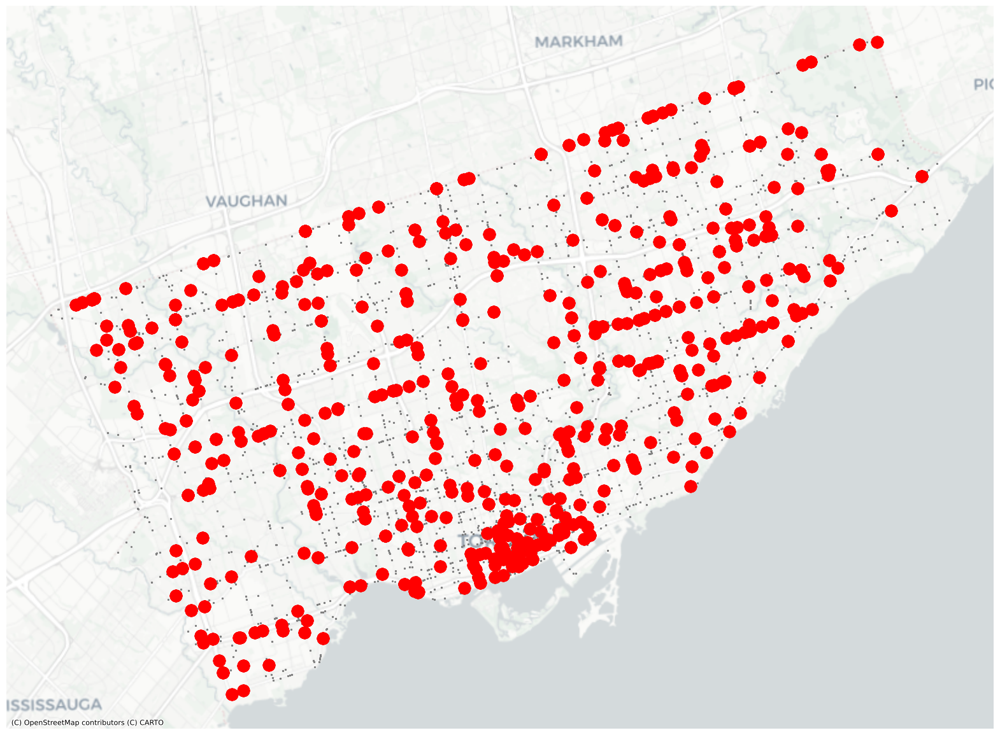

In [ ]:
db = data.query('AG_DRIV == "Yes"') # we will only use the data where there has been an accident related to aggessive driving
db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
cluster1(db)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

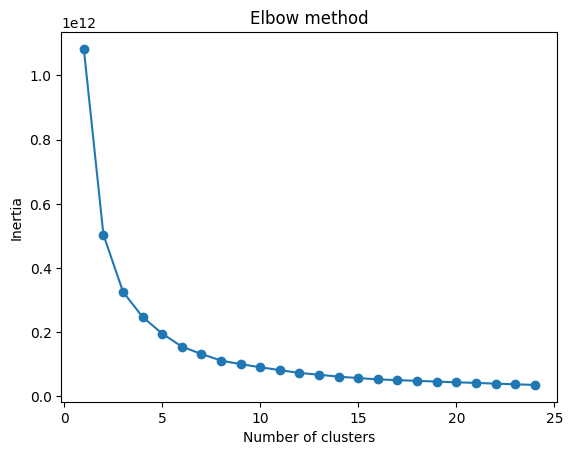

For n_clusters = 2 The average silhouette_score is : 0.5722430759193895
For n_clusters = 3 The average silhouette_score is : 0.5725925835946792
For n_clusters = 4 The average silhouette_score is : 0.536526198101854
For n_clusters = 5 The average silhouette_score is : 0.5387333093308774
For n_clusters = 6 The average silhouette_score is : 0.5257476134856713
For n_clusters = 7 The average silhouette_score is : 0.535578428113668
For n_clusters = 8 The average silhouette_score is : 0.5205047357303942
For n_clusters = 9 The average silhouette_score is : 0.5214490268820097
For n_clusters = 10 The average silhouette_score is : 0.5407840003071458
For n_clusters = 11 The average silhouette_score is : 0.5328603368044125
For n_clusters = 12 The average silhouette_score is : 0.535191364686492
For n_clusters = 13 The average silhouette_score is : 0.5277835470736746
For n_clusters = 14 The average silhouette_score is : 0.5264198114028957
For n_clusters = 15 The average silhouette_score is : 0.540657

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


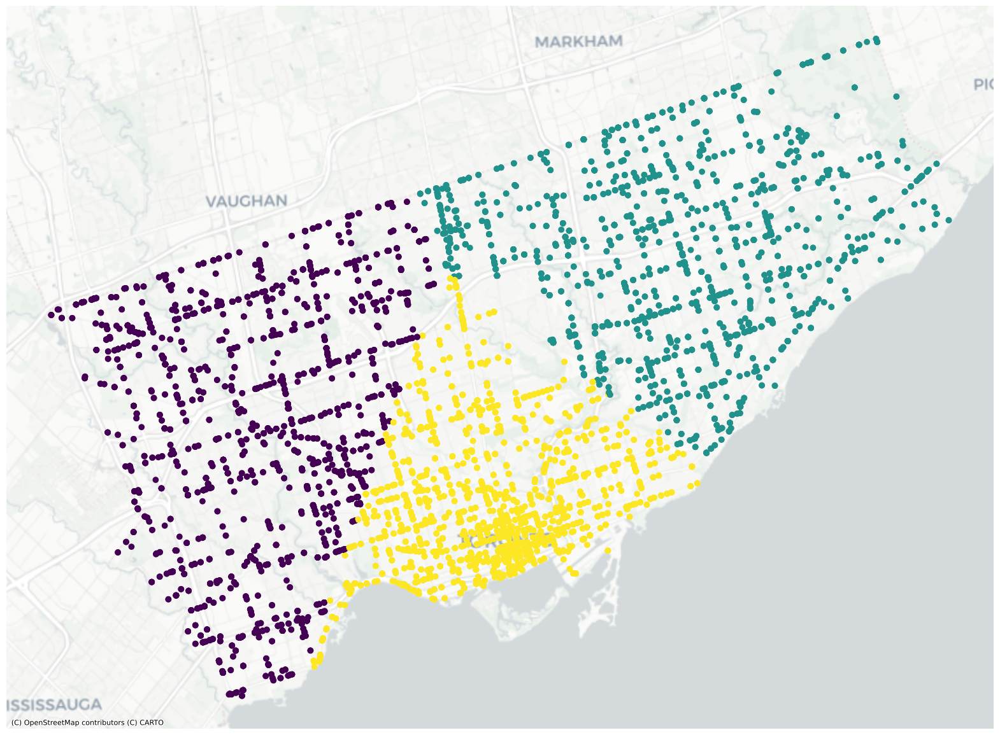

In [ ]:
coordinates = list(zip(db["x"], db["y"]))
elbow(coordinates)
silhoutte(np.array(db["x"]).reshape(-1,1), db["y"])
kmeans = KMeans(n_clusters=3)
cluster2(db, kmeans, coordinates)

<ipython-input-20-0c1d61b3c981>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
<ipython-input-20-0c1d61b3c981>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns


The maximum number of clusters is 109


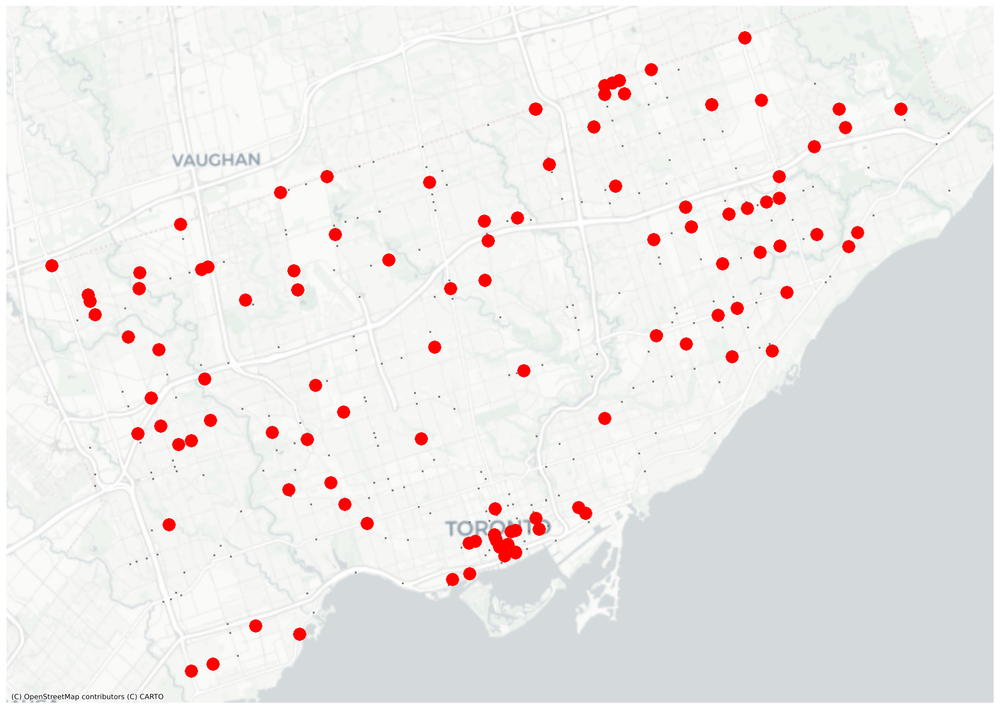

In [ ]:
db = data.query('REDLIGHT == "Yes"') # we will only use the data where there has been an accident related to red lights
db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
cluster1(db)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

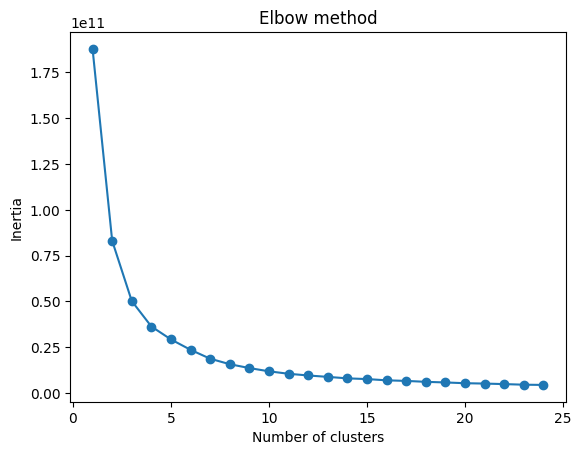

For n_clusters = 2 The average silhouette_score is : 0.603991547908327
For n_clusters = 3 The average silhouette_score is : 0.6012856573769557
For n_clusters = 4 The average silhouette_score is : 0.607676213338649
For n_clusters = 5 The average silhouette_score is : 0.6028263570343004
For n_clusters = 6 The average silhouette_score is : 0.6021557967394695
For n_clusters = 7 The average silhouette_score is : 0.5726947352659486
For n_clusters = 8 The average silhouette_score is : 0.5772134734279053
For n_clusters = 9 The average silhouette_score is : 0.5617344080688129
For n_clusters = 10 The average silhouette_score is : 0.5493616343065926
For n_clusters = 11 The average silhouette_score is : 0.5673607227052351
For n_clusters = 12 The average silhouette_score is : 0.5703544491717827
For n_clusters = 13 The average silhouette_score is : 0.5830579692184502
For n_clusters = 14 The average silhouette_score is : 0.590115818476464
For n_clusters = 15 The average silhouette_score is : 0.573650

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


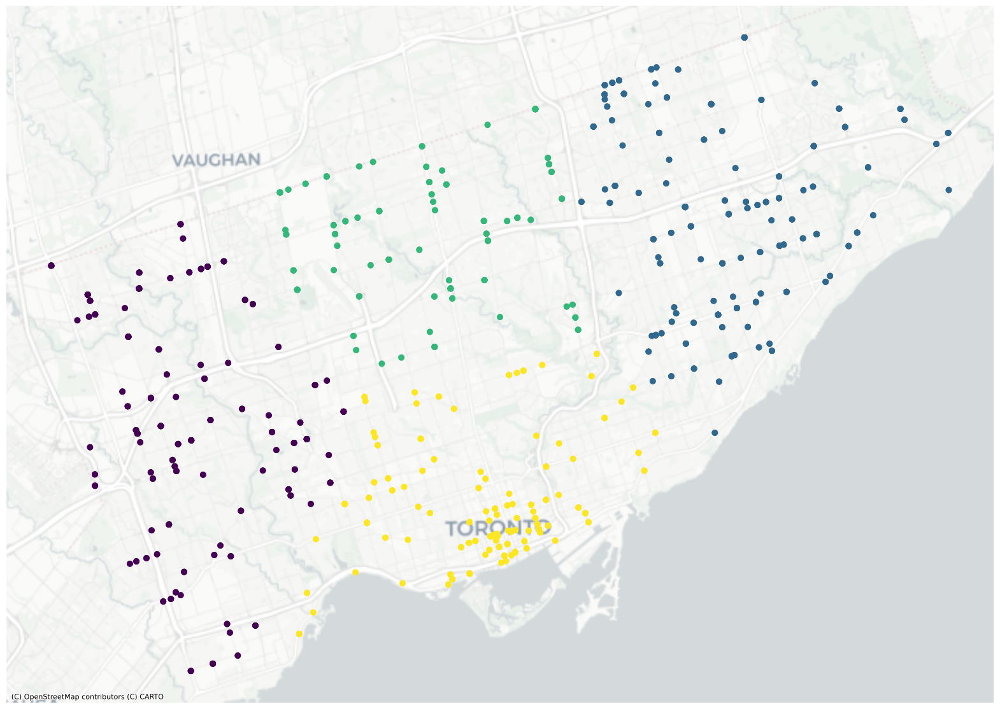

In [ ]:
coordinates = list(zip(db["x"], db["y"]))
elbow(coordinates)
silhoutte(np.array(db["x"]).reshape(-1,1), db["y"])
kmeans = KMeans(n_clusters=4)
cluster2(db, kmeans, coordinates)

<ipython-input-22-6ce15690c5b5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
<ipython-input-22-6ce15690c5b5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns


The maximum number of clusters is 48


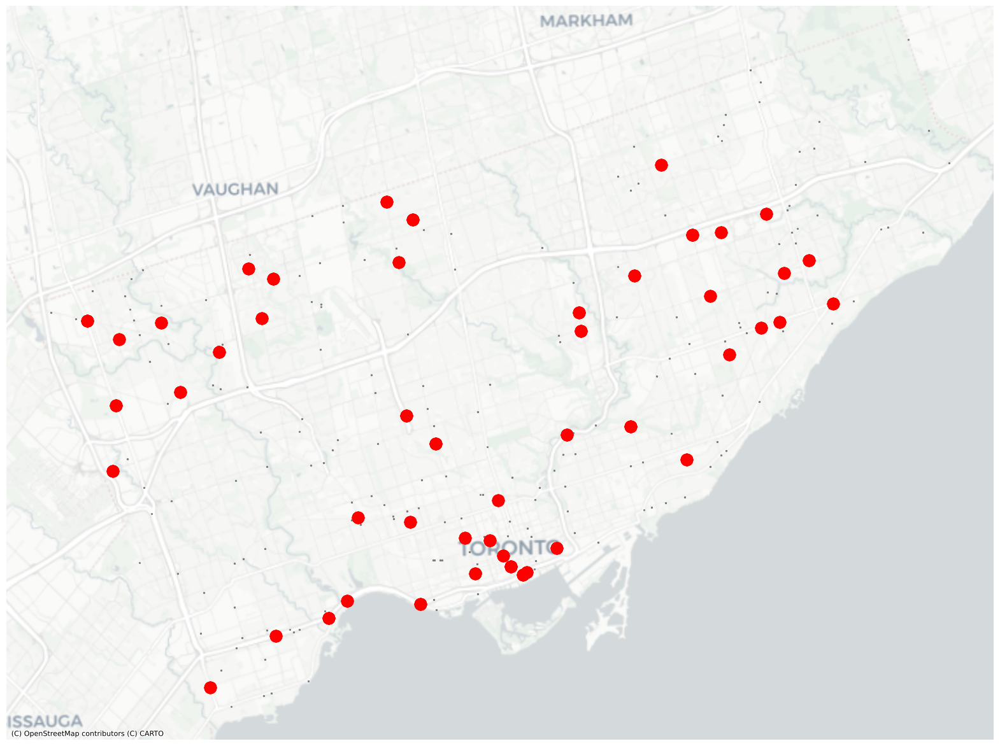

In [ ]:
db = data.query('ALCOHOL == "Yes"') # we will only use the data where there has been an accident related to alcohol
db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
cluster1(db)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

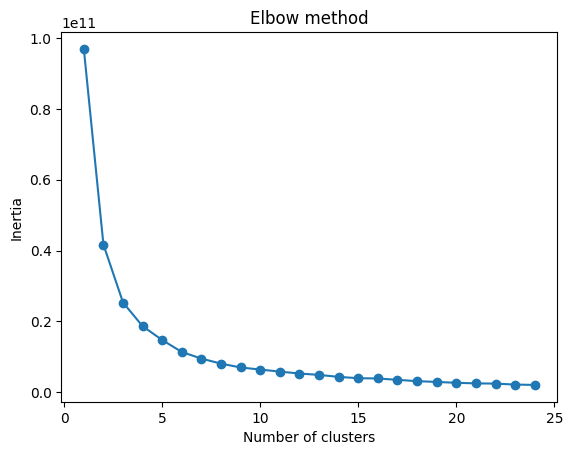

For n_clusters = 2 The average silhouette_score is : 0.5932497831786164
For n_clusters = 3 The average silhouette_score is : 0.5991235848263716
For n_clusters = 4 The average silhouette_score is : 0.5686361556466425
For n_clusters = 5 The average silhouette_score is : 0.5668093263665737
For n_clusters = 6 The average silhouette_score is : 0.5728639281982649
For n_clusters = 7 The average silhouette_score is : 0.5643172181337572
For n_clusters = 8 The average silhouette_score is : 0.5822112980833395
For n_clusters = 9 The average silhouette_score is : 0.5820713920706567
For n_clusters = 10 The average silhouette_score is : 0.5658513005377563
For n_clusters = 11 The average silhouette_score is : 0.574797016792178
For n_clusters = 12 The average silhouette_score is : 0.5814227805699552
For n_clusters = 13 The average silhouette_score is : 0.5871600916754219
For n_clusters = 14 The average silhouette_score is : 0.5983824092051325
For n_clusters = 15 The average silhouette_score is : 0.5983

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


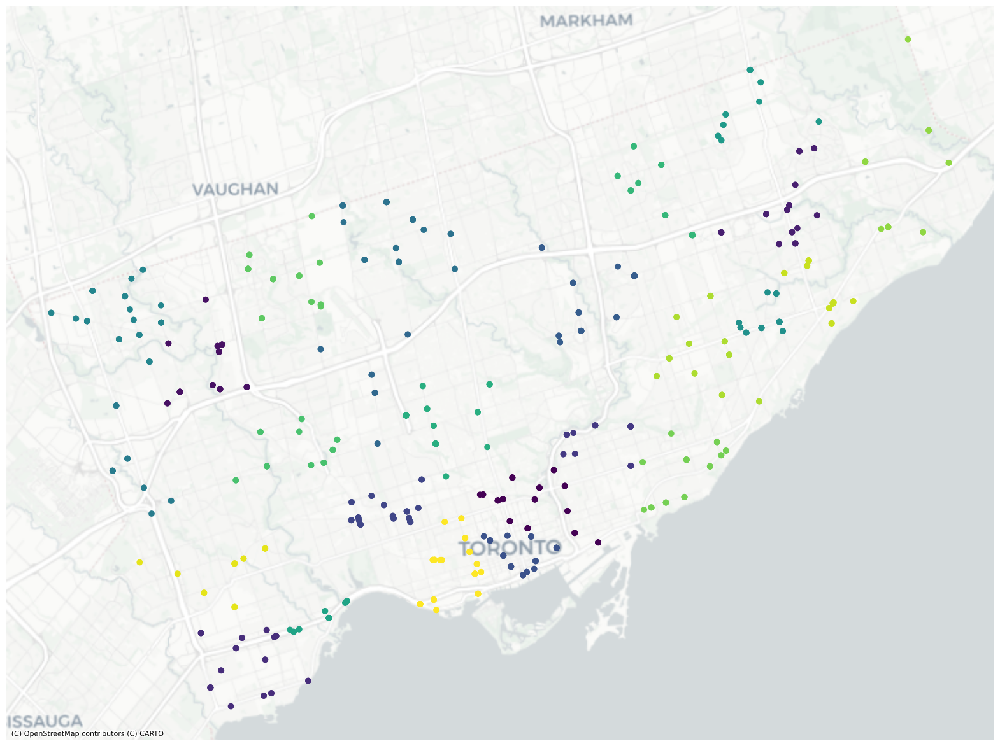

In [ ]:
coordinates = list(zip(db["x"], db["y"]))
elbow(coordinates)
silhoutte(np.array(db["x"]).reshape(-1,1), db["y"])
kmeans = KMeans(n_clusters=25)
cluster2(db, kmeans, coordinates)

<ipython-input-24-d4233795b7b0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
<ipython-input-24-d4233795b7b0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns


The maximum number of clusters is 24


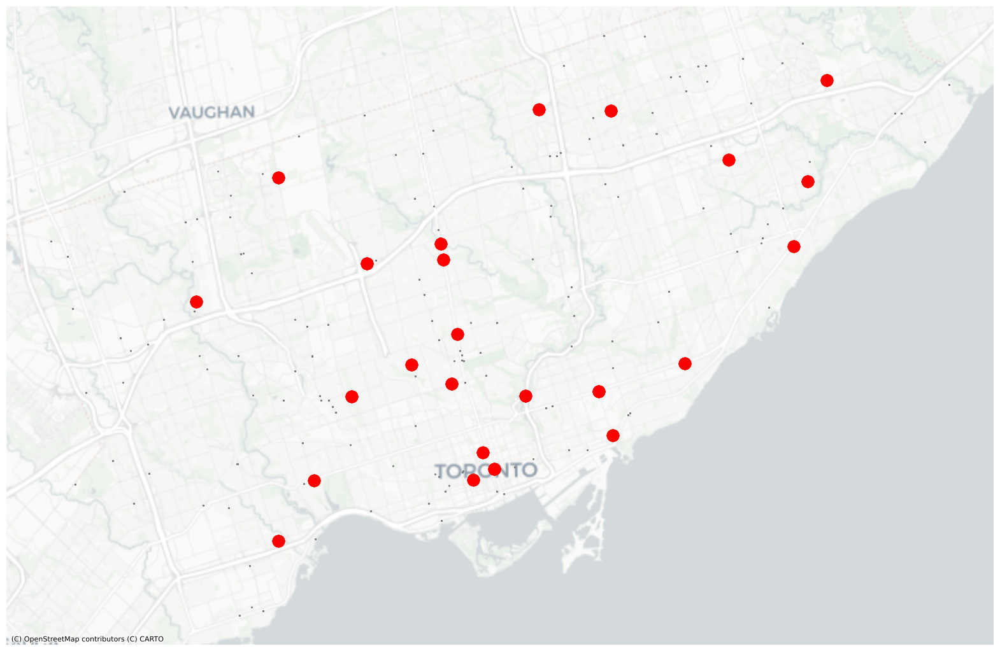

In [ ]:
db = data.query('DISABILITY == "Yes"') # we will only use the data where there has been an accident related to disabilities
db["x"], db["y"] = p(db["long"], db["lat"]) # converting and creating x and y columns
cluster1(db)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

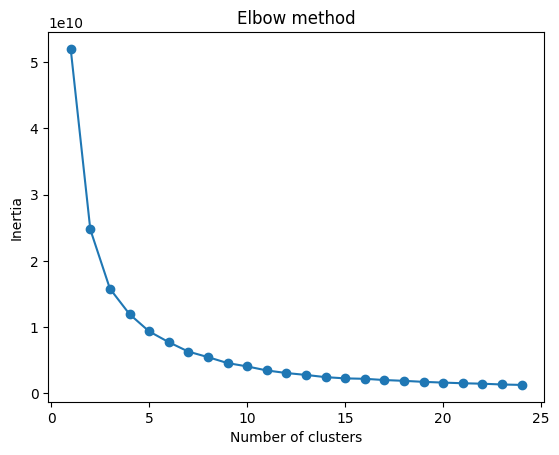

For n_clusters = 2 The average silhouette_score is : 0.545119674727463
For n_clusters = 3 The average silhouette_score is : 0.5767059173913656
For n_clusters = 4 The average silhouette_score is : 0.5596255681983603
For n_clusters = 5 The average silhouette_score is : 0.5950171794470863
For n_clusters = 6 The average silhouette_score is : 0.5870209358879748
For n_clusters = 7 The average silhouette_score is : 0.5706144431102927
For n_clusters = 8 The average silhouette_score is : 0.5834186312861626
For n_clusters = 9 The average silhouette_score is : 0.5958130550341199
For n_clusters = 10 The average silhouette_score is : 0.5779209447874261
For n_clusters = 11 The average silhouette_score is : 0.5850842774979195
For n_clusters = 12 The average silhouette_score is : 0.5879636427217717
For n_clusters = 13 The average silhouette_score is : 0.6027637609390949
For n_clusters = 14 The average silhouette_score is : 0.6074336653552459
For n_clusters = 15 The average silhouette_score is : 0.6237

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


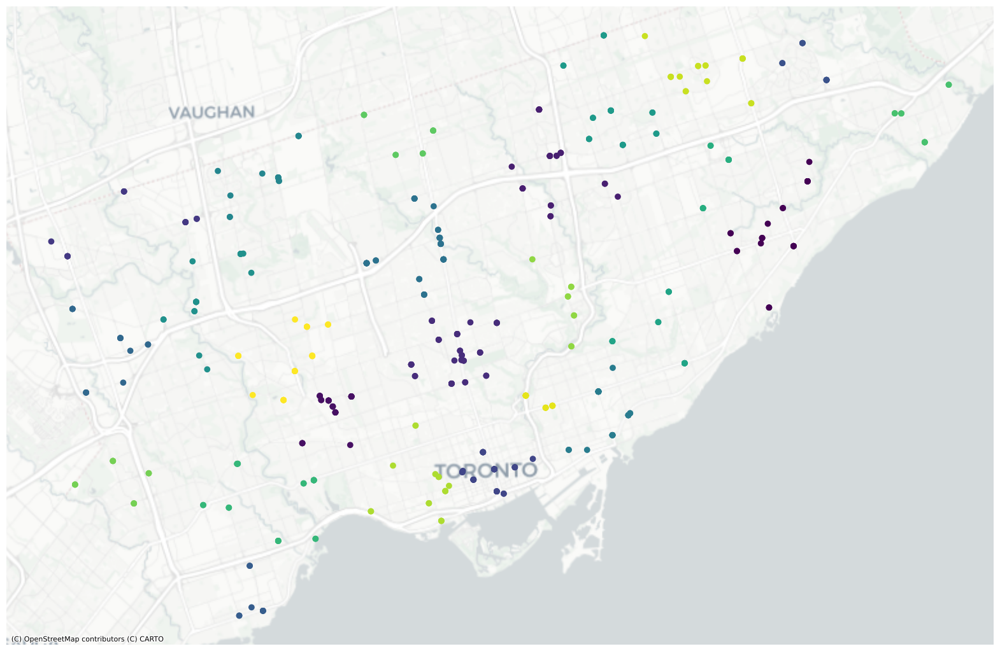

In [ ]:
coordinates = list(zip(db["x"], db["y"]))
elbow(coordinates)
silhoutte(np.array(db["x"]).reshape(-1,1), db["y"])
kmeans = KMeans(n_clusters=25)
cluster2(db, kmeans, coordinates)

In [ ]:
tree_data = pd.read_csv("Motor Vehicle Collisions with KSI Data.csv")
tree_data = tree_data.drop(["_id", "ACCNUM", "YEAR", "DATE", "TIME", "STREET1", "STREET2", "OFFSET", "ROAD_CLASS", "DISTRICT", "WARDNUM", "LOCCOORD", "ACCLOC", "TRAFFCTL", "VISIBILITY", "LIGHT", "RDSFCOND", "ACCLASS", "IMPACTYPE", "FATAL_NO", "INITDIR", "VEHTYPE", "MANOEUVER", "DRIVACT", "DRIVCOND", "PEDTYPE", "PEDACT", "PEDCOND", "CYCLISTYPE", "CYCACT", "CYCCOND", "HOOD_158", "NEIGHBOURHOOD_158", "HOOD_140", "NEIGHBOURHOOD_140", "DIVISION", "geometry"], axis = 1)
tree_data2 = tree_data.apply(LabelEncoder().fit_transform)

Feature Importances:
INVTYPE          0.226503
INVAGE           0.310053
PEDESTRIAN       0.084863
CYCLIST          0.030428
AUTOMOBILE       0.020561
MOTORCYCLE       0.023151
TRUCK            0.029135
TRSN_CITY_VEH    0.028662
EMERG_VEH        0.002305
PASSENGER        0.102843
SPEEDING         0.029458
AG_DRIV          0.038490
REDLIGHT         0.030567
ALCOHOL          0.023294
DISABILITY       0.019686
dtype: float64

Accuracy: 0.6048364935421819
Classification Report:
              precision    recall  f1-score   support

       Fatal       0.22      0.49      0.31       215
       Major       0.76      0.51      0.61      1229
     Minimal       0.19      0.34      0.25       234
       Minor       0.22      0.44      0.29       282
        None       0.93      0.75      0.83      1679

    accuracy                           0.60      3639
   macro avg       0.47      0.51      0.46      3639
weighted avg       0.73      0.60      0.65      3639

Confusion Matrix:
[[ 105   73   

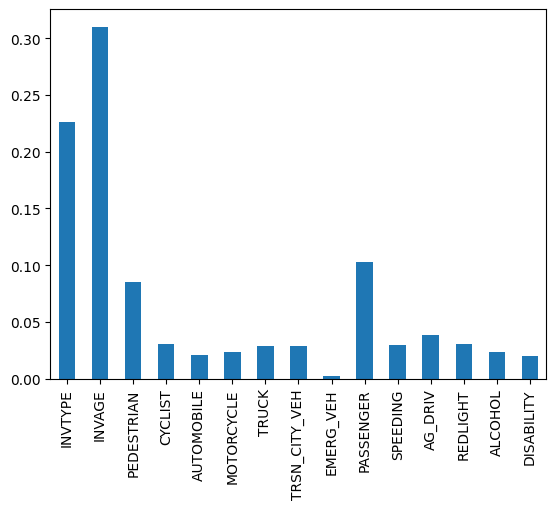

In [ ]:
X = tree_data2.drop(["INJURY"], axis = 1)
y = tree_data.INJURY

X_train, X_test, y_train, y_test = train_test_split(X,
                                                y,
                                                test_size = 0.2,
                                                random_state = 0)

dtree = DecisionTreeClassifier(class_weight = "balanced", random_state = 10)
dtree = dtree.fit(X_train, y_train)

feature_importance = pd.Series(dtree.feature_importances_, index=X.columns)
print("Feature Importances:")
print(feature_importance)

feature_importance.plot(kind='bar')


predictions = dtree.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
classification_report_output = classification_report(y_test, predictions)
conf_matrix = confusion_matrix(y_test, predictions)

print("")
print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_output)
print("Confusion Matrix:")
print(conf_matrix)

# tree.plot_tree(dtree, feature_names=["INVTYPE","INVAGE","PEDESTRIAN","CYCLIST","AUTOMOBILE","MOTORCYCLE","TRUCK","TRSN_CITY_VEH","EMERG_VEH","PASSENGER","SPEEDING","AG_DRIV", "REDLIGHT", "ALCOHOL", "DISABILITY"])

[Text(0.6711000629439635, 0.9807692307692307, 'PASSENGER <= 0.5\ngini = 0.8\nsamples = 14555\nvalue = [2911.0, 2911.0, 2911.0, 2911.0, 2911.0]'),
 Text(0.38885141015572594, 0.9423076923076923, 'INVAGE <= 19.5\ngini = 0.764\nsamples = 9019\nvalue = [2183.25, 2046.335, 769.499, 704.768, 1906.435]'),
 Text(0.30056120898791255, 0.9038461538461539, 'INVTYPE <= 4.5\ngini = 0.76\nsamples = 7553\nvalue = [2175.119, 2029.183, 756.402, 694.554, 1303.357]'),
 Text(0.18361617091068794, 0.8653846153846154, 'PEDESTRIAN <= 0.5\ngini = 0.774\nsamples = 4719\nvalue = [536.665, 794.877, 622.148, 480.06, 1210.804]'),
 Text(0.10406774606728382, 0.8269230769230769, 'INVTYPE <= 1.0\ngini = 0.787\nsamples = 2836\nvalue = [532.599, 777.726, 474.798, 380.473, 463.19]'),
 Text(0.03470160830482324, 0.7884615384615384, 'TRUCK <= 0.5\ngini = 0.5\nsamples = 550\nvalue = [146.363, 295.713, 9.823, 12.768, 2.536]'),
 Text(0.028080348158583218, 0.75, 'INVAGE <= 11.5\ngini = 0.469\nsamples = 511\nvalue = [105.707, 278.5

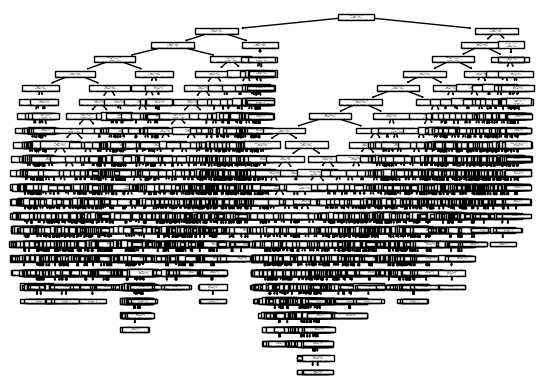

In [ ]:
tree.plot_tree(dtree, feature_names=["INVTYPE","INVAGE","PEDESTRIAN","CYCLIST","AUTOMOBILE","MOTORCYCLE","TRUCK","TRSN_CITY_VEH","EMERG_VEH","PASSENGER","SPEEDING","AG_DRIV", "REDLIGHT", "ALCOHOL", "DISABILITY"])

In [ ]:
# Create a decision tree with balanced class weights
base_classifier = dtree

# Create AdaBoost classifier with the decision tree as the base estimator
adaboost_classifier = AdaBoostClassifier(base_classifier, random_state=10)

# Train the AdaBoost classifier
adaboost_classifier.fit(X_train, y_train)

# Make predictions
adaboost_predictions = adaboost_classifier.predict(X_test)

# Evaluate the AdaBoost classifier
adaboost_accuracy = accuracy_score(y_test, adaboost_predictions)
adaboost_classification_report = classification_report(y_test, adaboost_predictions)
adaboost_confusion_matrix = confusion_matrix(y_test, adaboost_predictions)

print("Accuracy", adaboost_accuracy)
print("Classification Report:")
print(adaboost_classification_report)
print("Confusion Matrix:")
print(adaboost_confusion_matrix)

Accuracy 0.6048364935421819
Classification Report:
              precision    recall  f1-score   support

       Fatal       0.22      0.48      0.30       215
       Major       0.76      0.51      0.61      1229
     Minimal       0.18      0.32      0.23       234
       Minor       0.22      0.44      0.29       282
        None       0.91      0.76      0.83      1679

    accuracy                           0.60      3639
   macro avg       0.46      0.50      0.45      3639
weighted avg       0.72      0.60      0.64      3639

Confusion Matrix:
[[ 103   75   11   24    2]
 [ 296  624  107  157   45]
 [   5   31   74   81   43]
 [  22   40   64  124   32]
 [  37   46  144  176 1276]]


Feature Importances:
INVTYPE          0.301600
INVAGE           0.224415
PEDESTRIAN       0.121236
CYCLIST          0.044436
AUTOMOBILE       0.010342
MOTORCYCLE       0.028195
TRUCK            0.016967
TRSN_CITY_VEH    0.011467
EMERG_VEH        0.000000
PASSENGER        0.161331
SPEEDING         0.030215
AG_DRIV          0.019644
REDLIGHT         0.016516
ALCOHOL          0.007178
DISABILITY       0.006459
dtype: float64

Accuracy: 0.6240725474031328
Classification Report:
              precision    recall  f1-score   support

       Fatal       0.25      0.47      0.33       215
       Major       0.74      0.57      0.64      1229
     Minimal       0.19      0.09      0.13       234
       Minor       0.23      0.68      0.34       282
        None       0.94      0.74      0.83      1679

    accuracy                           0.62      3639
   macro avg       0.47      0.51      0.45      3639
weighted avg       0.73      0.62      0.66      3639

Confusion Matrix:
[[ 101   86   

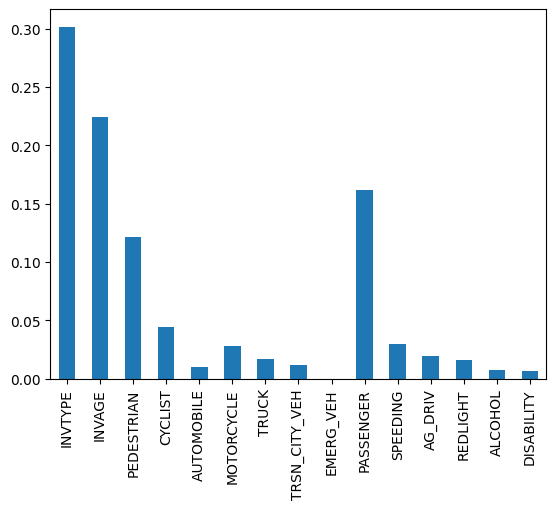

In [ ]:
dtree = DecisionTreeClassifier(class_weight = "balanced", random_state = 10, max_depth=9) # best depth to maximize accuracy
dtree = dtree.fit(X_train, y_train)

feature_importance = pd.Series(dtree.feature_importances_, index=X.columns)
print("Feature Importances:")
print(feature_importance)

feature_importance.plot(kind='bar')

predictions = dtree.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
classification_report_output = classification_report(y_test, predictions)
conf_matrix = confusion_matrix(y_test, predictions)

print("")
print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_output)
print("Confusion Matrix:")
print(conf_matrix)

# tree.plot_tree(dtree, feature_names=["INVTYPE","INVAGE","PEDESTRIAN","CYCLIST","AUTOMOBILE","MOTORCYCLE","TRUCK","TRSN_CITY_VEH","EMERG_VEH","PASSENGER","SPEEDING","AG_DRIV", "REDLIGHT", "ALCOHOL", "DISABILITY"])

[Text(0.6406475144092219, 0.95, 'PASSENGER <= 0.5\ngini = 0.8\nsamples = 14555\nvalue = [2911.0, 2911.0, 2911.0, 2911.0, 2911.0]'),
 Text(0.40300792507204614, 0.85, 'INVAGE <= 19.5\ngini = 0.764\nsamples = 9019\nvalue = [2183.25, 2046.335, 769.499, 704.768, 1906.435]'),
 Text(0.27503602305475505, 0.75, 'INVTYPE <= 4.5\ngini = 0.76\nsamples = 7553\nvalue = [2175.119, 2029.183, 756.402, 694.554, 1303.357]'),
 Text(0.16480547550432276, 0.65, 'PEDESTRIAN <= 0.5\ngini = 0.774\nsamples = 4719\nvalue = [536.665, 794.877, 622.148, 480.06, 1210.804]'),
 Text(0.08609510086455331, 0.55, 'INVTYPE <= 1.0\ngini = 0.787\nsamples = 2836\nvalue = [532.599, 777.726, 474.798, 380.473, 463.19]'),
 Text(0.045389048991354465, 0.45, 'TRUCK <= 0.5\ngini = 0.5\nsamples = 550\nvalue = [146.363, 295.713, 9.823, 12.768, 2.536]'),
 Text(0.023054755043227664, 0.35, 'INVAGE <= 11.5\ngini = 0.469\nsamples = 511\nvalue = [105.707, 278.562, 9.823, 12.768, 2.536]'),
 Text(0.011527377521613832, 0.25, 'SPEEDING <= 0.5\ngi

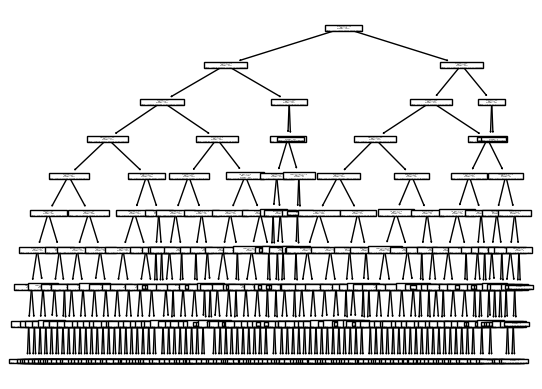

In [ ]:
tree.plot_tree(dtree, feature_names=["INVTYPE","INVAGE","PEDESTRIAN","CYCLIST","AUTOMOBILE","MOTORCYCLE","TRUCK","TRSN_CITY_VEH","EMERG_VEH","PASSENGER","SPEEDING","AG_DRIV", "REDLIGHT", "ALCOHOL", "DISABILITY"])

In [ ]:
# Create a decision tree with balanced class weights
base_classifier = dtree

# Create AdaBoost classifier with the decision tree as the base estimator
adaboost_classifier = AdaBoostClassifier(base_classifier, random_state=10)

# Train the AdaBoost classifier
adaboost_classifier.fit(X_train, y_train)

# Make predictions
adaboost_predictions = adaboost_classifier.predict(X_test)

# Evaluate the AdaBoost classifier
adaboost_accuracy = accuracy_score(y_test, adaboost_predictions)
adaboost_classification_report = classification_report(y_test, adaboost_predictions)
adaboost_confusion_matrix = confusion_matrix(y_test, adaboost_predictions)

print("Accuracy", adaboost_accuracy)
print("Classification Report:")
print(adaboost_classification_report)
print("Confusion Matrix:")
print(adaboost_confusion_matrix)

Accuracy 0.5567463588898048
Classification Report:
              precision    recall  f1-score   support

       Fatal       0.21      0.51      0.30       215
       Major       0.74      0.48      0.58      1229
     Minimal       0.14      0.34      0.20       234
       Minor       0.23      0.42      0.30       282
        None       0.91      0.67      0.77      1679

    accuracy                           0.56      3639
   macro avg       0.45      0.48      0.43      3639
weighted avg       0.71      0.56      0.61      3639

Confusion Matrix:
[[ 110   66   12   24    3]
 [ 354  590   97  147   41]
 [   5   30   80   77   42]
 [  19   46   72  118   27]
 [  27   61  318  145 1128]]


Feature Importances:
INVTYPE          0.248311
INVAGE           0.410457
PEDESTRIAN       0.073297
CYCLIST          0.024823
AUTOMOBILE       0.018248
MOTORCYCLE       0.021581
TRUCK            0.019238
TRSN_CITY_VEH    0.018838
EMERG_VEH        0.001909
PASSENGER        0.067668
SPEEDING         0.024396
AG_DRIV          0.024773
REDLIGHT         0.019053
ALCOHOL          0.015530
DISABILITY       0.011878
dtype: float64
Accuracy: 0.6306677658697445
Classification Report:
              precision    recall  f1-score   support

       Fatal       0.23      0.40      0.29       215
       Major       0.76      0.58      0.65      1229
     Minimal       0.20      0.30      0.24       234
       Minor       0.22      0.43      0.29       282
        None       0.92      0.78      0.84      1679

    accuracy                           0.63      3639
   macro avg       0.47      0.50      0.46      3639
weighted avg       0.72      0.63      0.67      3639

Confusion Matrix:
[[  86   93   1

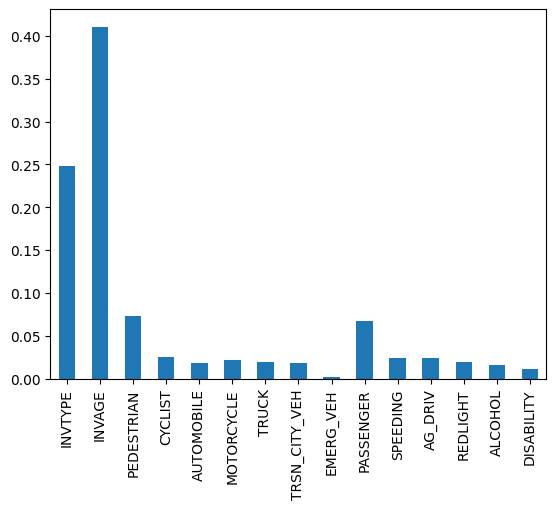

In [ ]:
rf_classifier = RandomForestClassifier(class_weight = "balanced", random_state=10)
rf_classifier.fit(X_train, y_train)

# Get feature importances
feature_importance = pd.Series(rf_classifier.feature_importances_, index=X.columns)

# Display feature importances
print("Feature Importances:")
print(feature_importance)

feature_importance.plot(kind='bar')

predictions = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
classification_report_output = classification_report(y_test, predictions)
conf_matrix = confusion_matrix(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_output)
print("Confusion Matrix:")
print(conf_matrix)

rf_classifier = RandomForestClassifier(class_weight = "balanced", random_state=10, max_depth = 9)
rf_classifier.fit(X_train, y_train)

predictions = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
classification_report_output = classification_report(y_test, predictions)
conf_matrix = confusion_matrix(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_output)
print("Confusion Matrix:")
print(conf_matrix)

Feature Importances:
PEDESTRIAN       0.182985
CYCLIST          0.070344
AUTOMOBILE       0.066482
MOTORCYCLE       0.053171
TRUCK            0.052595
TRSN_CITY_VEH    0.048989
EMERG_VEH        0.006840
PASSENGER        0.291406
SPEEDING         0.058154
AG_DRIV          0.054878
REDLIGHT         0.052117
ALCOHOL          0.039130
DISABILITY       0.022908
dtype: float64
Accuracy: 0.2833195932948612
Classification Report:
              precision    recall  f1-score   support

       Fatal       0.10      0.50      0.17       215
       Major       0.44      0.38      0.41      1229
     Minimal       0.17      0.38      0.23       234
       Minor       0.23      0.53      0.32       282
        None       0.58      0.13      0.21      1679

    accuracy                           0.28      3639
   macro avg       0.30      0.38      0.27      3639
weighted avg       0.45      0.28      0.28      3639

Confusion Matrix:
[[107  43  13  29  23]
 [363 473 121 167 105]
 [ 24  37  88  73  12

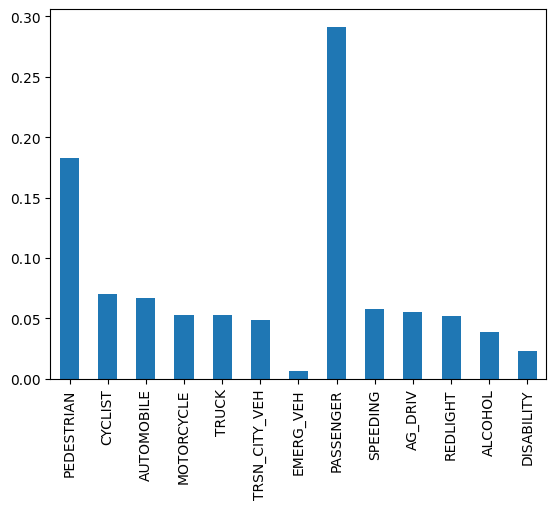

In [ ]:
# Create and train the Random Forest model
X = tree_data2.drop(["INJURY", "INVTYPE", "INVAGE"], axis = 1)
y = tree_data.INJURY

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

rf_classifier = RandomForestClassifier(class_weight = "balanced", random_state=10)
rf_classifier.fit(X_train, y_train)

# Get feature importances
feature_importance = pd.Series(rf_classifier.feature_importances_, index=X.columns)

# Display feature importances
print("Feature Importances:")
print(feature_importance)

feature_importance.plot(kind='bar')

predictions = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
classification_report_output = classification_report(y_test, predictions)
conf_matrix = confusion_matrix(y_test, predictions)

print("Accuracy:", accuracy)
print("Classification Report:")
print(classification_report_output)
print("Confusion Matrix:")
print(conf_matrix)

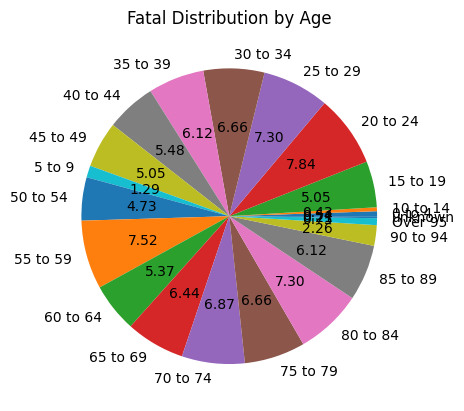

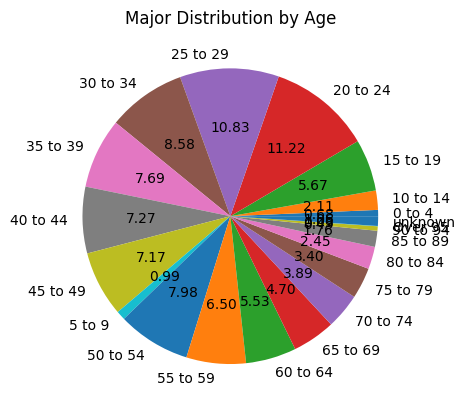

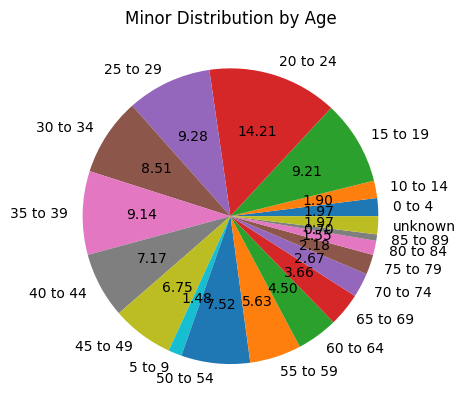

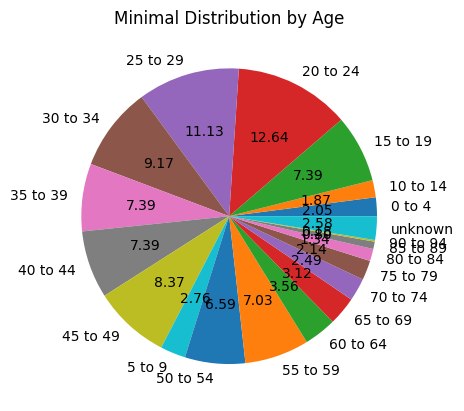

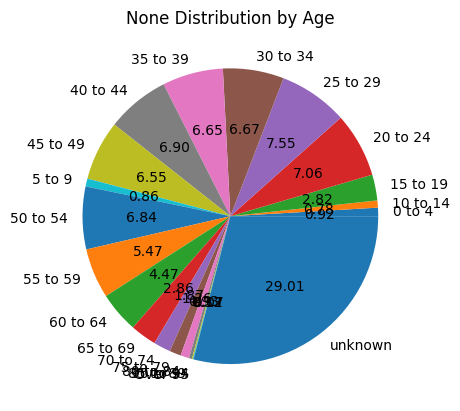

In [ ]:
db = tree_data.query('INJURY == "Fatal"')
db = db.groupby("INVAGE").size().plot(kind='pie', autopct='%.2f')
plt.title("Fatal Distribution by Age")
plt.ylabel("")
plt.show()

db = tree_data.query('INJURY == "Major"')
db = db.groupby("INVAGE").size().plot(kind='pie', autopct='%.2f')
plt.title("Major Distribution by Age")
plt.ylabel("")
plt.show()

db = tree_data.query('INJURY == "Minor"')
db = db.groupby("INVAGE").size().plot(kind='pie', autopct='%.2f')
plt.title("Minor Distribution by Age")
plt.ylabel("")
plt.show()

db = tree_data.query('INJURY == "Minimal"')
db = db.groupby("INVAGE").size().plot(kind='pie', autopct='%.2f')
plt.title("Minimal Distribution by Age")
plt.ylabel("")
plt.show()

db = tree_data.query('INJURY == "None"')
db = db.groupby("INVAGE").size().plot(kind='pie', autopct='%.2f')
plt.title("None Distribution by Age")
plt.ylabel("")
plt.show()

In [ ]:
svm_data = pd.read_csv("Motor Vehicle Collisions with KSI Data.csv")
svm_data["SAVEDTIME"] = svm_data["TIME"]
hours = svm_data["TIME"] // 100  # Truncating integer division
minutes = svm_data["TIME"] % 100  # Modulo removes the upper digits
time = []
for i in range(0,len(svm_data)):
    time.append(str(hours[i]) + ":" + str(minutes[i]))
svm_data["TIME"] = time
svm_data["DATE"] = svm_data["DATE"] + " " + svm_data["TIME"]
svm_data['DATE'] = pd.to_datetime(svm_data['DATE'])
svm_data['MONTH'] = svm_data["DATE"].dt.month_name()
svm_data["DAY"] = svm_data["DATE"].dt.day_name()
svm_data["DISTRICT"] = svm_data['DISTRICT'].replace("Toronto East York", "Toronto and East York")

for i in range(0, len(svm_data)):
  if svm_data.loc[i,"SAVEDTIME"] < 600:
    svm_data.at[i,"SAVEDTIME"]= "Past Midnight"
  elif svm_data.loc[i,"SAVEDTIME"] >= 600 and svm_data.loc[i,"SAVEDTIME"] < 1200:
    svm_data.at[i,"SAVEDTIME"] = "Morning - Noon"
  elif svm_data.loc[i,"SAVEDTIME"] >= 1200 and svm_data.loc[i,"SAVEDTIME"] < 1800:
    svm_data.at[i,"SAVEDTIME"] = "Afternoon - Evening"
  else:
    svm_data.at[i,"SAVEDTIME"] = "Evening - Midnight"

svm_data = svm_data.drop(["_id", "YEAR", "DATE", "TIME", "STREET1", "STREET2", "OFFSET", "ROAD_CLASS", "DISTRICT", "WARDNUM", "LOCCOORD", "ACCLOC", "ACCLASS", "IMPACTYPE", "INVAGE", "INJURY", "INVTYPE", "FATAL_NO", "INITDIR", "VEHTYPE", "MANOEUVER", "DRIVACT", "DRIVCOND", "PEDTYPE", "PEDACT", "PEDCOND", "CYCLISTYPE", "CYCACT", "CYCCOND", "PEDESTRIAN", "CYCLIST", "AUTOMOBILE", "MOTORCYCLE", "TRUCK", "TRSN_CITY_VEH", "EMERG_VEH", "PASSENGER", "HOOD_158", "NEIGHBOURHOOD_158", "HOOD_140", "NEIGHBOURHOOD_140", "DIVISION", "geometry"], axis = 1)
svm_data = svm_data.drop_duplicates(subset = ["ACCNUM"], keep = "first")
svm_data = svm_data.drop(["ACCNUM"], axis = "columns")
svm_data = pd.get_dummies(svm_data, drop_first = False, columns = ["MONTH", "DAY", "SAVEDTIME", "TRAFFCTL", "VISIBILITY", "LIGHT", "RDSFCOND"])

X = svm_data.drop(["SPEEDING", "AG_DRIV", "REDLIGHT", "ALCOHOL", "DISABILITY"], axis = 1)
y = svm_data.SPEEDING
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

from sklearn.svm import SVC
classifier = SVC(kernel= "linear", class_weight="balanced", C = 10)
gscv_svm = GridSearchCV(classifier, param_grid={}, cv=10, scoring = 'recall')
gscv_svm.fit(X_train, y_train)

#Make the prediction
predictions = gscv_svm.predict(X_test)
predicted_probabilities = gscv_svm.decision_function(X_test)

compute_performance(predictions, y_test, gscv_svm.classes_)

probs_adjusted = (predicted_probabilities > 1).astype(bool)
final_predictions = ['Yes' if prob == True else 'None' for prob in probs_adjusted]
final_predictions = np.array(final_predictions)
compute_performance(np.array(final_predictions), y_test, gscv_svm.classes_)
probs_adjusted = (predicted_probabilities > -1).astype(bool)
final_predictions = ['Yes' if prob == True else 'None' for prob in probs_adjusted]
final_predictions = np.array(final_predictions)
compute_performance(final_predictions, y_test, gscv_svm.classes_)

log_coefficients = pd.DataFrame({'variables': X.columns.values,
                         'coefficients': gscv_svm.best_estimator_.coef_[0]})
log_coefficients

# Results
# When the model predicts an accident as not speeding related, it is likely correct
# When the model predicts an accident as speeding related, there will be a high rate of false positives

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1573, in precision_recall_fscore_support
    labels = _check_

tp: 68 tn: 490 fp: 324 fn: 44
Accuracy: 0.603 Precision: 0.173 Sensitivity: 0.607 Specificity: 0.602
tp: 24 tn: 745 fp: 69 fn: 88
Accuracy: 0.83 Precision: 0.258 Sensitivity: 0.214 Specificity: 0.915
tp: 98 tn: 210 fp: 604 fn: 14
Accuracy: 0.333 Precision: 0.14 Sensitivity: 0.875 Specificity: 0.258


,variables,coefficients
0,MONTH_April,0.000189
1,MONTH_August,-0.000102
2,MONTH_December,-0.000086
3,MONTH_February,0.000249
4,MONTH_January,0.000085
...,...,...
57,RDSFCOND_Other,-2.323666
58,RDSFCOND_Packed Snow,-0.323730
59,RDSFCOND_Slush,1.675733
60,RDSFCOND_Spilled liquid,-0.322157


In [ ]:
classifier = SVC(kernel= "rbf", class_weight="balanced", C = 10)
gscv_svm = GridSearchCV(classifier, param_grid={}, cv=10, scoring = 'recall')
gscv_svm.fit(X_train, y_train)

#Make the prediction
predictions = gscv_svm.predict(X_test)
predicted_probabilities = gscv_svm.decision_function(X_test)

compute_performance(predictions, y_test, gscv_svm.classes_)

probs_adjusted = (predicted_probabilities > 1).astype(bool)
final_predictions = ['Yes' if prob == True else 'None' for prob in probs_adjusted]
final_predictions = np.array(final_predictions)
compute_performance(np.array(final_predictions), y_test, gscv_svm.classes_)
probs_adjusted = (predicted_probabilities > -1).astype(bool)
final_predictions = ['Yes' if prob == True else 'None' for prob in probs_adjusted]
final_predictions = np.array(final_predictions)
compute_performance(final_predictions, y_test, gscv_svm.classes_)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1573, in precision_recall_fscore_support
    labels = _check_

tp: 47 tn: 617 fp: 197 fn: 65
Accuracy: 0.717 Precision: 0.193 Sensitivity: 0.42 Specificity: 0.758
tp: 11 tn: 762 fp: 52 fn: 101
Accuracy: 0.835 Precision: 0.175 Sensitivity: 0.098 Specificity: 0.936
tp: 85 tn: 319 fp: 495 fn: 27
Accuracy: 0.436 Precision: 0.147 Sensitivity: 0.759 Specificity: 0.392


In [ ]:
y = svm_data.AG_DRIV
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

classifier = SVC(kernel= "linear", C = 10)
gscv_svm = GridSearchCV(classifier, param_grid={}, cv=10, scoring = 'recall')
gscv_svm.fit(X_train, y_train)

#Make the prediction
predictions = gscv_svm.predict(X_test)
predicted_probabilities = gscv_svm.decision_function(X_test)

compute_performance(predictions, y_test, gscv_svm.classes_)

probs_adjusted = (predicted_probabilities > 1).astype(bool)
final_predictions = ['Yes' if prob == True else 'None' for prob in probs_adjusted]
final_predictions = np.array(final_predictions)
compute_performance(np.array(final_predictions), y_test, gscv_svm.classes_)
probs_adjusted = (predicted_probabilities > -1).astype(bool)
final_predictions = ['Yes' if prob == True else 'None' for prob in probs_adjusted]
final_predictions = np.array(final_predictions)
compute_performance(final_predictions, y_test, gscv_svm.classes_)

log_coefficients = pd.DataFrame({'variables': X.columns.values,
                         'coefficients': gscv_svm.best_estimator_.coef_[0]})
log_coefficients


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 2098, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 1573, in precision_recall_fscore_support
    labels = _check_

tp: 274 tn: 280 fp: 194 fn: 178
Accuracy: 0.598 Precision: 0.585 Sensitivity: 0.606 Specificity: 0.591
tp: 130 tn: 391 fp: 83 fn: 322
Accuracy: 0.563 Precision: 0.61 Sensitivity: 0.288 Specificity: 0.825
tp: 403 tn: 91 fp: 383 fn: 49
Accuracy: 0.533 Precision: 0.513 Sensitivity: 0.892 Specificity: 0.192


,variables,coefficients
0,MONTH_April,0.000040
1,MONTH_August,-0.000069
2,MONTH_December,0.000040
3,MONTH_February,0.000099
4,MONTH_January,-0.000170
...,...,...
57,RDSFCOND_Other,0.009819
58,RDSFCOND_Packed Snow,0.010344
59,RDSFCOND_Slush,0.010161
60,RDSFCOND_Spilled liquid,0.000000


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=eea8f81c-64ff-41f5-af3c-6c848b0b084e' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>